In [1]:
!pip install pytubefix

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 20.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/59.8 MB 26.2 MB/s eta 0:00:0000:0100:01m


In [2]:
import os
import cv2
import imageio
import matplotlib.pyplot as plt
from tqdm import tqdm
from pathlib import Path
from pytubefix import YouTube
import tensorflow as tf
from tensorflow.keras import layers, models
import requests
import numpy as np

2026-02-26 03:06:53.017845: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1772075213.249276      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1772075213.312006      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1772075213.842831      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1772075213.842871      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1772075213.842874      55 computation_placer.cc:177] computation placer alr

In [3]:
video_url = 'https://youtu.be/h1u5OzTdbpc'
video_loc = 'video'

In [4]:
CONFIG = {'image_width': 512,
'image_height': 512,
'num_classes': 20,
'out_fig_width': 6,
'out_fig_height': 3,
'frames_loc': 'processed_frames',
'video_loc': 'video',
'out_gif_name': 'segmented_movie.gif',
'out_video_name': 'demo_video.mp4',
'seg_video_name': 'segmented_video.mp4',
'model_loc': 'models',
# 'deployed_model': 'unet',
'deployed_model': 'deeplabv3',
'unet_model_doi': 18778819,
'deeplabv3_model_doi': 18778871,
'mean': [0.485, 0.456, 0.406],
'std':  [0.229, 0.224, 0.225]
}

In [5]:
def create_folder(directory: str) -> None:
    """Create a folder if it does not already exist."""
    Path(directory).mkdir(parents=True, exist_ok=True)

In [23]:
def initialize_directories() -> None:
    """Create required directories if they do not exist."""
    for folder_name in ("video", "processed_frames", "models", "images"):
        create_folder(folder_name)

In [24]:
initialize_directories()

In [8]:
def download_youtube_video(youtube_url: str, output_dir: str) -> str:
    """Download YouTube video at 720p progressive stream."""
    print("Downloading YouTube video: %s", youtube_url)
    yt = YouTube(youtube_url, on_progress_callback=on_progress)
    stream = yt.streams.filter(res="360p", progressive=True).first()
    if stream is None:
        raise RuntimeError(
            "No compatible 360p progressive stream available for this URL"
        )

    output_path = os.path.join(output_dir, CONFIG["out_video_name"])
    stream.download(output_path=output_dir, filename=CONFIG["out_video_name"])
    print("Saved source video to %s", output_path)
    return output_path

In [9]:
def on_progress(stream, _chunk, bytes_remaining):
    """Track YouTube download progress."""
    total_size = stream.filesize
    bytes_downloaded = total_size - bytes_remaining
    percentage = (bytes_downloaded / total_size) * 100
    print("YouTube download progress: %.2f%%", percentage)

In [10]:
download_youtube_video(video_url, video_loc)

YouTube download progress: %.2f%% 100.0
Saved source video to %s video/demo_video.mp4


'video/demo_video.mp4'

In [11]:
def process_video(video_path: str) -> None:
    """Process an input video and generate segmented frame images."""
    print("Segmenting video frames from %s", video_path)
    model = load_model()
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise FileNotFoundError(f"Unable to open video file: {video_path}")

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_idx = 0

    for old_frame in Path(CONFIG["frames_loc"]).glob("frame_*.png"):
        old_frame.unlink(missing_ok=True)

    with tqdm(total=total_frames, desc="segment-frames") as pbar:
        while cap.isOpened():
            ret, frame_raw = cap.read()
            if not ret:
                break

            frame_raw = cv2.resize(
                frame_raw, (CONFIG["image_width"], CONFIG["image_height"])
            )
            frame_raw = frame_raw.astype(np.float32) / 255.0
            frame_out = predict_with_model(model, frame_raw)
            plot_n_save(frame_idx, frame_raw, frame_out)

            frame_idx += 1
            pbar.update(1)

    print("Processed %s frames", frame_idx)
    cap.release()
    cv2.destroyAllWindows()

In [12]:
def load_model():
    model_name = CONFIG["deployed_model"]
    model_path = Path(CONFIG["model_loc"], model_name + ".keras")
    if model_name == "unet":
        model = build_unet()
    elif model_name == "deeplabv3":
        model = build_deeplabv3plus()
    model.load_weights(model_path)
    return model

In [13]:
def ASPP(x, filters=256):

    y1 = layers.Conv2D(filters, 1, padding="same", use_bias=False)(x)
    y1 = layers.BatchNormalization()(y1)
    y1 = layers.ReLU()(y1)

    y2 = layers.Conv2D(filters, 3, dilation_rate=6, padding="same", use_bias=False)(x)
    y2 = layers.BatchNormalization()(y2)
    y2 = layers.ReLU()(y2)

    y3 = layers.Conv2D(filters, 3, dilation_rate=12, padding="same", use_bias=False)(x)
    y3 = layers.BatchNormalization()(y3)
    y3 = layers.ReLU()(y3)

    y4 = layers.Conv2D(filters, 3, dilation_rate=18, padding="same", use_bias=False)(x)
    y4 = layers.BatchNormalization()(y4)
    y4 = layers.ReLU()(y4)

    y = layers.Concatenate()([y1, y2, y3, y4])
    y = layers.Conv2D(filters, 1, padding="same", use_bias=False)(y)
    y = layers.BatchNormalization()(y)
    y = layers.ReLU()(y)

    return y


def build_deeplabv3plus():

    IMG_HEIGHT = CONFIG["image_height"]
    IMG_WIDTH = CONFIG["image_width"]
    NUM_CLASSES = CONFIG["num_classes"]

    base_model = tf.keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
    )

    # Low-level features
    low_level = base_model.get_layer("conv2_block3_out").output
    high_level = base_model.get_layer("conv4_block6_out").output

    # ASPP
    aspp = ASPP(high_level)

    # Upsample ASPP output
    aspp = layers.UpSampling2D(size=(4, 4), interpolation="bilinear")(aspp)

    # Reduce low-level features
    low_level = layers.Conv2D(48, 1, padding="same", use_bias=False)(low_level)
    low_level = layers.BatchNormalization()(low_level)
    low_level = layers.ReLU()(low_level)

    # Concatenate
    x = layers.Concatenate()([aspp, low_level])

    x = layers.Conv2D(256, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Final upsampling
    x = layers.UpSampling2D(size=(4, 4), interpolation="bilinear")(x)

    outputs = layers.Conv2D(NUM_CLASSES, 1, activation="softmax")(x)

    model = models.Model(inputs=base_model.input, outputs=outputs)

    return model

In [14]:
def download_model():
    """Download the pretrained model if not already available."""
    model_name = CONFIG["deployed_model"]
    model_path = Path(CONFIG["model_loc"]) / f"{model_name}.keras"

    if model_path.exists():
        print("Using existing model at %s", model_path)
        return model_path

    print("Downloading pretrained model '%s'", model_name)

    if CONFIG["deployed_model"] == "unet":
        doi = CONFIG["unet_model_doi"]
    elif CONFIG["deployed_model"] == "deeplabv3":
        doi = CONFIG["deeplabv3_model_doi"]

    download_url = f"https://zenodo.org/api/records/{doi}"
    record = _request_json(download_url)
    model_files = [
        file for file in record.get("files", []) if file["key"].endswith(".keras")
    ]

    if not model_files:
        raise RuntimeError("No .keras model files found in Zenodo record")

    file_url = model_files[0]["links"]["self"]
    response = requests.get(file_url, stream=True, timeout=60)
    response.raise_for_status()
    total = int(response.headers.get("content-length", 0))

    with model_path.open("wb") as handle, tqdm(
        total=total,
        unit="B",
        unit_scale=True,
        desc="model-download",
    ) as pbar:
        for chunk in response.iter_content(chunk_size=8192):
            if chunk:
                handle.write(chunk)
                pbar.update(len(chunk))

    print("Model downloaded to %s", model_path)
    return model_path

In [15]:
def _request_json(url: str, timeout: int = 30) -> dict:
    response: Response = requests.get(url, timeout=timeout)
    response.raise_for_status()
    return response.json()

In [16]:
download_model()

model-download: 100%|██████████| 211M/211M [00:13<00:00, 15.7MB/s] 

Model downloaded to %s models/deeplabv3.keras


PosixPath('models/deeplabv3.keras')

In [17]:
def predict_with_model(model, image: np.ndarray) -> tf.Tensor:
    """Predict segmentation mask from a single normalized BGR image."""
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (CONFIG["image_width"], CONFIG["image_height"]))
    pred_image = model.predict(image[np.newaxis, :, :, :], verbose=0)
    pred_image = pred_image[0, :, :, :]
    return tf.argmax(pred_image, axis=-1)

In [18]:
def plot_n_save(k: int, original, segmented) -> None:
    """Display and save original and segmented images side by side."""
    fig, ax = plt.subplots(1, 2)
    fig.tight_layout()
    ax[0].imshow(original)
    ax[0].set_xlabel("Original video")
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    ax[1].imshow(segmented)
    ax[1].set_xlabel("Segmented video")
    ax[1].set_xticks([])
    ax[1].set_yticks([])

    fig.set_size_inches(CONFIG["out_fig_width"], CONFIG["out_fig_height"])
    fig.savefig(os.path.join(CONFIG["frames_loc"], f"frame_{k}.png"), dpi=200)
    plt.close(fig)


In [19]:
process_video('./video/demo_video.mp4')

I0000 00:00:1772075254.936436      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5


Segmenting video frames from %s ./video/demo_video.mp4


I0000 00:00:1772075254.939358      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


segment-frames:   0%|          | 0/1499 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1772075260.423100     134 service.cc:152] XLA service 0x7b6d60068a60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1772075260.423139     134 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1772075260.423145     134 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1772075261.224482     134 cuda_dnn.cc:529] Loaded cuDNN version 91002
I0000 00:00:1772075267.056768     134 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
segment-frames: 100%|██████████| 1499/1499 [11:50<00:00,  2.11it/s]

Processed %s frames 1499


In [20]:
def gif_creator(filenames: list[str]) -> None:
    """Create segmented GIF video from rendered frame images."""
    output_path = os.path.join("images", CONFIG["out_gif_name"])
    with imageio.get_writer(output_path, mode="I") as writer:
        for filename in tqdm(filenames, desc="write-gif"):
            image = imageio.imread(os.path.join(CONFIG["frames_loc"], filename))
            writer.append_data(image)

In [21]:
def get_list_of_seg_images() -> list[str]:
    """Return segmented frame images in numeric order."""
    image_folder = Path(CONFIG["frames_loc"])
    images = []

    for img in image_folder.glob("frame_*.png"):
        try:
            index = int(img.stem.split("_")[1])
        except (IndexError, ValueError):
            continue
        images.append((index, img.name))

    images.sort(key=lambda item: item[0])
    return [name for _, name in images]


In [30]:
images = get_list_of_seg_images()
if not images:
    raise RuntimeError("No segmented frames generated; cannot create output GIF")
gif_creator(images[:200])

write-gif:   0%|          | 0/200 [00:00<?, ?it/s]/tmp/ipykernel_55/1802073934.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(os.path.join(CONFIG["frames_loc"], filename))
write-gif: 100%|██████████| 200/200 [00:03<00:00, 54.74it/s]


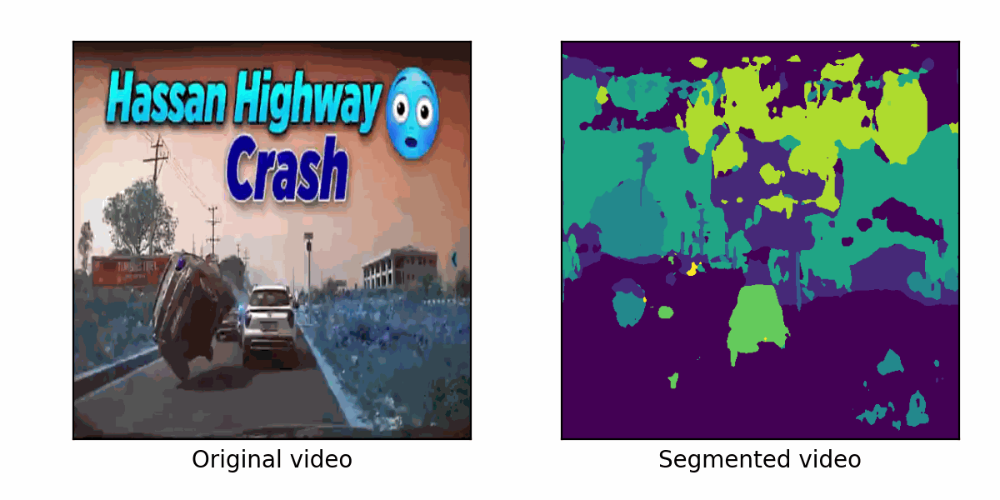

In [31]:
from IPython.display import Image, display
with open('/kaggle/working/images/segmented_movie.gif', 'rb') as file:
    display(Image(file.read(), format='gif'))